In [5]:
import pandas as pd
import numpy as np
from datetime import datetime, timedelta
import warnings
warnings.filterwarnings('ignore')

# ============================================================================
# CONFIGURAÇÕES
# ============================================================================
# Threshold em termos de desvios padrão (resíduos padronizados)
# 1.0 = variação dentro de 1 desvio padrão = neutro
# Ajuste conforme necessário (0.5, 1.0, 1.5, 2.0, etc.)
THRESHOLD_STANDARDIZED = 2

print("="*80)
print("CLASSIFICAÇÃO DE NOTÍCIAS COM NORMALIZAÇÃO GARCH")
print("Método: Resíduos Padronizados (Standardized Residuals)")
print("="*80)

# ============================================================================
# CARREGAR DADOS
# ============================================================================
print("\n[1/5] Carregando dados...")
noticias_df = pd.read_csv('../dataset/noticias_cafe.csv')
series_df = pd.read_csv('../dataset/M5_ICF$.csv', sep='\t')

# Converter colunas de data/hora
noticias_df['data_hora'] = pd.to_datetime(noticias_df['data_hora'], format='%d/%m/%Y %H:%M')
series_df['Time'] = pd.to_datetime(series_df['Time'], format='%Y.%m.%d %H:%M:%S')

# Ordenar série temporal
series_df = series_df.sort_values('Time').reset_index(drop=True)

print(f"  ✓ Total de notícias: {len(noticias_df)}")
print(f"  ✓ Total de registros na série: {len(series_df)}")
print(f"  ✓ Período da série: {series_df['Time'].min()} até {series_df['Time'].max()}")

# ============================================================================
# PREPARAR MODELO GARCH - CALCULAR VOLATILIDADE CONDICIONAL
# ============================================================================
def prepare_garch_volatility(series_df):
    """
    Calcula volatilidade condicional usando modelo GARCH(1,1)
    e resíduos padronizados para normalização
    """
    print("\n[2/5] Preparando modelo GARCH para normalização...")
    print("  → Calculando log-retornos...")
    
    # Calcular log-retornos: ln(Pt / Pt-1)
    series_df['log_return'] = np.log(series_df['Close'] / series_df['Close'].shift(1))
    series_df = series_df.dropna().reset_index(drop=True)
    
    print(f"    • Log-retornos calculados: {len(series_df)} observações")
    print(f"    • Média dos retornos: {series_df['log_return'].mean():.6f}")
    print(f"    • Desvio padrão dos retornos: {series_df['log_return'].std():.6f}")
    
    # Tentar ajustar modelo GARCH
    print("\n  → Ajustando modelo GARCH(1,1)...")
    try:
        from arch import arch_model
        
        # Multiplicar por 100 para melhor convergência numérica
        returns_scaled = series_df['log_return'] * 100
        
        # Ajustar GARCH(1,1)
        model = arch_model(
            returns_scaled,
            vol='Garch',
            p=1,
            q=1,
            mean='Constant',
            rescale=False
        )
        
        model_fitted = model.fit(disp='off', show_warning=False)
        
        # Extrair volatilidade condicional (dividir por 100 para voltar à escala original)
        series_df['conditional_vol'] = model_fitted.conditional_volatility.values / 100
        
        # Calcular resíduos padronizados
        series_df['std_residual'] = series_df['log_return'] / series_df['conditional_vol']
        
        print(f"    ✓ Modelo GARCH ajustado com sucesso!")
        print(f"    • Parâmetros estimados:")
        print(f"      - ω (omega): {model_fitted.params['omega']:.6f}")
        print(f"      - α (alpha[1]): {model_fitted.params['alpha[1]']:.6f}")
        print(f"      - β (beta[1]): {model_fitted.params['beta[1]']:.6f}")
        print(f"    • Volatilidade condicional:")
        print(f"      - Média: {series_df['conditional_vol'].mean():.6f}")
        print(f"      - Min: {series_df['conditional_vol'].min():.6f}")
        print(f"      - Max: {series_df['conditional_vol'].max():.6f}")
        print(f"    • Resíduos padronizados:")
        print(f"      - Média: {series_df['std_residual'].mean():.6f}")
        print(f"      - Std: {series_df['std_residual'].std():.6f} (deve ser ~1.0)")
        
        garch_success = True
        
    except ImportError:
        print("    ⚠ Biblioteca 'arch' não encontrada. Instalando...")
        import subprocess
        subprocess.check_call(['pip', 'install', 'arch', '--break-system-packages'])
        print("    ✓ Biblioteca instalada! Execute o script novamente.")
        exit(0)
        
    except Exception as e:
        print(f"    ⚠ Erro ao ajustar GARCH: {e}")
        print(f"    → Usando fallback: Rolling Standard Deviation (janela de 30 dias)")
        
        # Fallback: usar rolling std como proxy para volatilidade
        series_df['conditional_vol'] = series_df['log_return'].rolling(
            window=30, 
            min_periods=10
        ).std()
        
        # Preencher valores iniciais com std global
        global_std = series_df['log_return'].std()
        series_df['conditional_vol'].fillna(global_std, inplace=True)
        
        # Calcular resíduos padronizados
        series_df['std_residual'] = series_df['log_return'] / series_df['conditional_vol']
        
        print(f"    • Volatilidade (rolling std):")
        print(f"      - Média: {series_df['conditional_vol'].mean():.6f}")
        print(f"    • Resíduos padronizados:")
        print(f"      - Std: {series_df['std_residual'].std():.6f}")
        
        garch_success = False
    
    return series_df, garch_success

# Aplicar preparação GARCH
series_df, garch_success = prepare_garch_volatility(series_df)

# ============================================================================
# FUNÇÕES AUXILIARES
# ============================================================================
def get_closest_price_before(target_datetime, series_df):
    """Retorna o preço de fechamento mais próximo ANTES ou no momento da notícia"""
    mask = series_df['Time'] <= target_datetime
    if mask.sum() == 0:
        return None, None
    closest_idx = series_df[mask].index[-1]
    return series_df.loc[closest_idx, 'Close'], closest_idx

def get_closest_price_after(target_datetime, series_df):
    """Retorna o preço de fechamento mais próximo APÓS o tempo target"""
    mask = series_df['Time'] >= target_datetime
    if mask.sum() == 0:
        return None
    closest_idx = series_df[mask].index[0]
    return series_df.loc[closest_idx, 'Close']

def get_standardized_change(price_before, price_after, ref_idx, series_df):
    """
    Calcula mudança normalizada usando resíduos padronizados
    
    Retorna: variação em termos de "número de desvios padrão"
    """
    if price_before == 0 or price_after == 0:
        return None
    
    # Log-retorno da mudança
    log_change = np.log(price_after / price_before)
    
    # Buscar volatilidade condicional no momento da notícia
    vol_at_news = series_df.loc[ref_idx, 'conditional_vol']
    
    if pd.isna(vol_at_news) or vol_at_news == 0:
        return None
    
    # Normalizar pela volatilidade condicional
    # Esta é a variação em "número de desvios padrão"
    standardized_change = log_change / vol_at_news
    
    return standardized_change

# ============================================================================
# CLASSIFICAR NOTÍCIAS
# ============================================================================
def classify_news(row, series_df):
    """Classifica uma notícia baseada em mudanças normalizadas (resíduos padronizados)"""
    news_datetime = row['data_hora']
    
    # Preço de referência (mais próximo da notícia, antes ou no momento)
    price_ref, ref_idx = get_closest_price_before(news_datetime, series_df)
    
    if price_ref is None:
        return None  # Notícia antes da série temporal
    
    # Calcular datas futuras
    datetime_1d = news_datetime + timedelta(days=1)
    datetime_7d = news_datetime + timedelta(days=7)
    datetime_30d = news_datetime + timedelta(days=30)
    
    # Buscar preços futuros
    price_1d = get_closest_price_after(datetime_1d, series_df)
    price_7d = get_closest_price_after(datetime_7d, series_df)
    price_30d = get_closest_price_after(datetime_30d, series_df)
    
    # Se não houver dados futuros suficientes, retornar None
    if price_1d is None or price_7d is None or price_30d is None:
        return None
    
    # Calcular variações PADRONIZADAS (em termos de desvios padrão)
    std_var_1d = get_standardized_change(price_ref, price_1d, ref_idx, series_df)
    std_var_7d = get_standardized_change(price_ref, price_7d, ref_idx, series_df)
    std_var_30d = get_standardized_change(price_ref, price_30d, ref_idx, series_df)
    
    if std_var_1d is None or std_var_7d is None or std_var_30d is None:
        return None
    
    # Volatilidade no momento da notícia (para referência)
    vol_at_news = series_df.loc[ref_idx, 'conditional_vol']
    
    # Classificar baseado em threshold de desvios padrão
    result = {
        'noticia': row['resumo'],
        'data_hora': news_datetime,
        
        # Classificações binárias
        'neutro_dia': 1 if abs(std_var_1d) < THRESHOLD_STANDARDIZED else 0,
        'dia': 1 if std_var_1d > 0 else 0,
        'neutro_semana': 1 if abs(std_var_7d) < THRESHOLD_STANDARDIZED else 0,
        'semana': 1 if std_var_7d > 0 else 0,
        'neutro_mes': 1 if abs(std_var_30d) < THRESHOLD_STANDARDIZED else 0,
        'mes': 1 if std_var_30d > 0 else 0,
        
        # Valores normalizados (em desvios padrão)
        'std_var_1d': std_var_1d,
        'std_var_7d': std_var_7d,
        'std_var_30d': std_var_30d,
        
        # Volatilidade condicional no momento da notícia
        'volatilidade_momento': vol_at_news,
        
        # Preços (para debug/análise)
        'preco_ref': price_ref,
        'preco_1d': price_1d,
        'preco_7d': price_7d,
        'preco_30d': price_30d,
    }
    
    return result

# ============================================================================
# PROCESSAR TODAS AS NOTÍCIAS
# ============================================================================
print("\n[3/5] Classificando notícias com normalização GARCH...")
results = []
skipped = 0

for idx, row in noticias_df.iterrows():
    if idx % 100 == 0 and idx > 0:
        print(f"  → Processadas {idx}/{len(noticias_df)} notícias ({idx/len(noticias_df)*100:.1f}%)...")
    
    classification = classify_news(row, series_df)
    
    if classification is not None:
        results.append(classification)
    else:
        skipped += 1

# ============================================================================
# CRIAR DATAFRAME E SALVAR
# ============================================================================
print("\n[4/5] Gerando arquivo de saída...")
output_df = pd.DataFrame(results)

print(f"  ✓ Total de notícias classificadas: {len(output_df)}")
print(f"  ✓ Total de notícias descartadas (sem dados futuros): {skipped}")

# Salvar resultado
output_filename = 'noticias_classificadas_garch.csv'
output_df.to_csv(output_filename, index=False)
print(f"  ✓ Arquivo '{output_filename}' gerado com sucesso!")

# ============================================================================
# ESTATÍSTICAS E ANÁLISE
# ============================================================================
print("\n[5/5] Gerando estatísticas...")
print("\n" + "="*80)
print("ESTATÍSTICAS DA CLASSIFICAÇÃO")
print("="*80)

print(f"\n📊 Distribuição de Classificações (Threshold = {THRESHOLD_STANDARDIZED} desvios padrão):")
print("-"*80)
print(f"{'Período':<15} {'Neutras':<15} {'Alta':<15} {'Queda':<15}")
print("-"*80)

# Dia
neutras_dia = output_df['neutro_dia'].sum()
alta_dia = output_df[(output_df['neutro_dia'] == 0) & (output_df['dia'] == 1)].shape[0]
queda_dia = output_df[(output_df['neutro_dia'] == 0) & (output_df['dia'] == 0)].shape[0]
print(f"{'1 Dia':<15} {neutras_dia:<15} {alta_dia:<15} {queda_dia:<15}")

# Semana
neutras_semana = output_df['neutro_semana'].sum()
alta_semana = output_df[(output_df['neutro_semana'] == 0) & (output_df['semana'] == 1)].shape[0]
queda_semana = output_df[(output_df['neutro_semana'] == 0) & (output_df['semana'] == 0)].shape[0]
print(f"{'7 Dias':<15} {neutras_semana:<15} {alta_semana:<15} {queda_semana:<15}")

# Mês
neutras_mes = output_df['neutro_mes'].sum()
alta_mes = output_df[(output_df['neutro_mes'] == 0) & (output_df['mes'] == 1)].shape[0]
queda_mes = output_df[(output_df['neutro_mes'] == 0) & (output_df['mes'] == 0)].shape[0]
print(f"{'30 Dias':<15} {neutras_mes:<15} {alta_mes:<15} {queda_mes:<15}")

print("\n" + "-"*80)
print(f"📈 Percentuais:")
print("-"*80)
print(f"Dia    → Neutras: {neutras_dia/len(output_df)*100:.1f}%  |  Alta: {alta_dia/len(output_df)*100:.1f}%  |  Queda: {queda_dia/len(output_df)*100:.1f}%")
print(f"Semana → Neutras: {neutras_semana/len(output_df)*100:.1f}%  |  Alta: {alta_semana/len(output_df)*100:.1f}%  |  Queda: {queda_semana/len(output_df)*100:.1f}%")
print(f"Mês    → Neutras: {neutras_mes/len(output_df)*100:.1f}%  |  Alta: {alta_mes/len(output_df)*100:.1f}%  |  Queda: {queda_mes/len(output_df)*100:.1f}%")

print("\n" + "-"*80)
print(f"📊 Estatísticas das Variações Padronizadas (em desvios padrão):")
print("-"*80)
print(f"{'Período':<10} {'Média':<12} {'Std':<12} {'Min':<12} {'Max':<12}")
print("-"*80)
print(f"{'1 Dia':<10} {output_df['std_var_1d'].mean():>11.3f} {output_df['std_var_1d'].std():>11.3f} {output_df['std_var_1d'].min():>11.3f} {output_df['std_var_1d'].max():>11.3f}")
print(f"{'7 Dias':<10} {output_df['std_var_7d'].mean():>11.3f} {output_df['std_var_7d'].std():>11.3f} {output_df['std_var_7d'].min():>11.3f} {output_df['std_var_7d'].max():>11.3f}")
print(f"{'30 Dias':<10} {output_df['std_var_30d'].mean():>11.3f} {output_df['std_var_30d'].std():>11.3f} {output_df['std_var_30d'].min():>11.3f} {output_df['std_var_30d'].max():>11.3f}")

print("\n" + "-"*80)
print(f"💡 Interpretação:")
print("-"*80)
print(f"• |variação| < {THRESHOLD_STANDARDIZED} desvios padrão = NEUTRO (comportamento normal do mercado)")
print(f"• |variação| ≥ {THRESHOLD_STANDARDIZED} desvios padrão = IMPACTO SIGNIFICATIVO")
print(f"• Valores positivos = alta do preço")
print(f"• Valores negativos = queda do preço")

print("\n" + "="*80)
print("PREVIEW DOS DADOS CLASSIFICADOS")
print("="*80)
display_cols = ['noticia', 'neutro_dia', 'dia', 'std_var_1d', 'std_var_7d', 'std_var_30d', 'volatilidade_momento']
print(output_df[display_cols].head(10).to_string())

print("\n" + "="*80)
print("✓ CLASSIFICAÇÃO CONCLUÍDA COM SUCESSO!")
print("="*80)
print(f"Método utilizado: {'GARCH(1,1)' if garch_success else 'Rolling Std (fallback)'}")
print(f"Threshold: {THRESHOLD_STANDARDIZED} desvios padrão")
print(f"Arquivo gerado: {output_filename}")
print("="*80)

CLASSIFICAÇÃO DE NOTÍCIAS COM NORMALIZAÇÃO GARCH
Método: Resíduos Padronizados (Standardized Residuals)

[1/5] Carregando dados...
  ✓ Total de notícias: 6246
  ✓ Total de registros na série: 70587
  ✓ Período da série: 2021-01-04 09:00:00 até 2026-01-02 15:55:00

[2/5] Preparando modelo GARCH para normalização...
  → Calculando log-retornos...
    • Log-retornos calculados: 70586 observações
    • Média dos retornos: 0.000018
    • Desvio padrão dos retornos: 0.002922

  → Ajustando modelo GARCH(1,1)...
    ✓ Modelo GARCH ajustado com sucesso!
    • Parâmetros estimados:
      - ω (omega): 0.001400
      - α (alpha[1]): 0.008115
      - β (beta[1]): 0.975607
    • Volatilidade condicional:
      - Média: 0.002911
      - Min: 0.001693
      - Max: 0.008094
    • Resíduos padronizados:
      - Média: 0.006722
      - Std: 0.997646 (deve ser ~1.0)

[3/5] Classificando notícias com normalização GARCH...
  → Processadas 100/6246 notícias (1.6%)...
  → Processadas 200/6246 notícias (3.2%).

VISUALIZAÇÃO DA ZONA NEUTRA GARCH
Foco: Região onde |variação| < 1σ (desvio padrão)

✓ Série temporal: 70587 registros
✓ Período: 2021-01-04 até 2026-01-02
✓ Desvio padrão dos resíduos: 0.998 (deve ser ~1.0)

FUNÇÕES DISPONÍVEIS:
1. plot_neutral_zone_simple(threshold=1.0, save_fig=True)
   → Visualização simples da zona neutra (série completa)

2. plot_neutral_heatmap(save_fig=True)
   → Mapa de calor da zona neutra

3. plot_neutral_analysis(save_fig=True)
   → Análise completa e detalhada

4. plot_neutral_zone_quarterly(save_fig=True)
   → Gráficos detalhados POR TRIMESTRE (vários gráficos)

5. plot_neutral_zone_grid(save_fig=True)
   → Grid com todos os trimestres em uma figura

📊 Gerando visualizações trimestrais...

1️⃣ Gerando GRID de todos os trimestres...

GRID DE COMPARAÇÃO - TODOS OS TRIMESTRES
✓ Grid salvo: zona_neutra_grid_trimestres.png


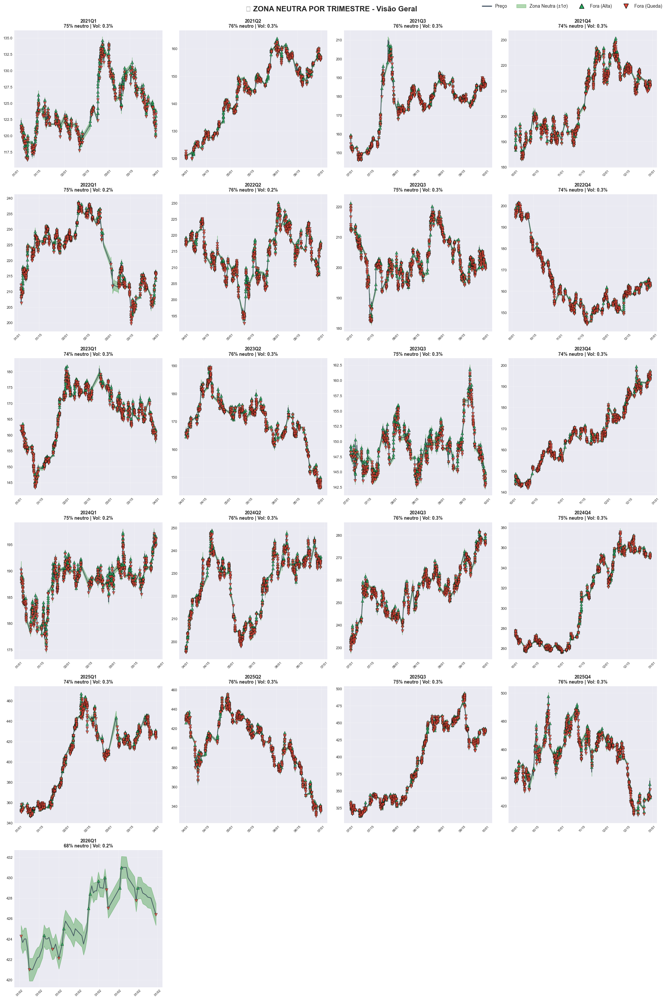


2️⃣ Gerando gráficos INDIVIDUAIS por trimestre...
(Isso vai gerar um arquivo para cada trimestre)

VISUALIZAÇÃO DA ZONA NEUTRA POR TRIMESTRE

Total de trimestres: 21

[1/21] Plotando trimestre 2021Q1...
  ✓ Salvo: zona_neutra_trimestre_2021Q1.png


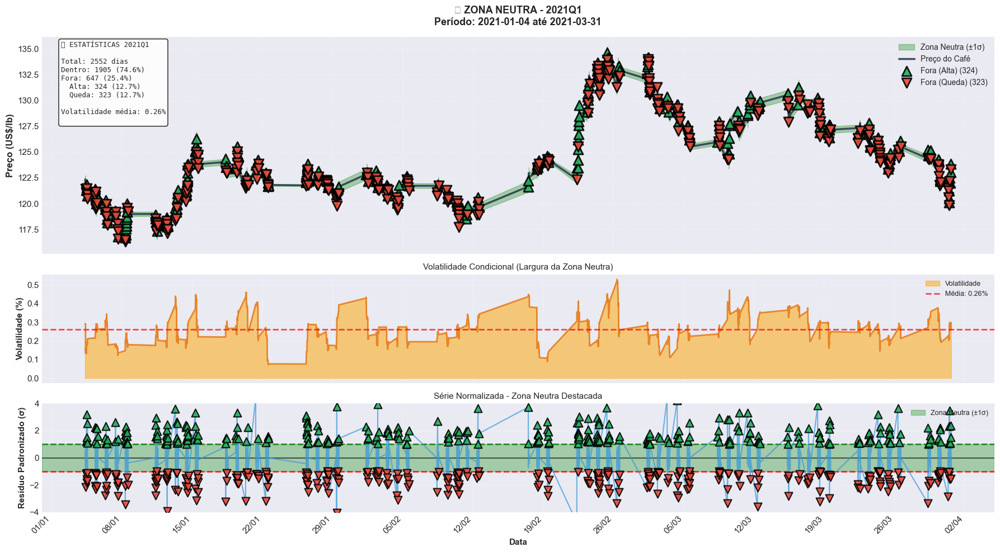


[2/21] Plotando trimestre 2021Q2...
  ✓ Salvo: zona_neutra_trimestre_2021Q2.png


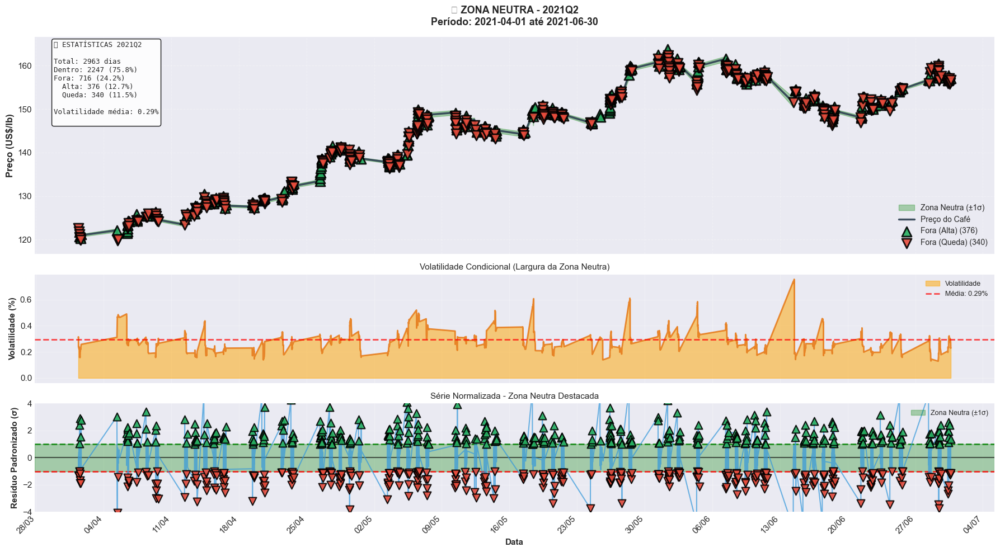


[3/21] Plotando trimestre 2021Q3...
  ✓ Salvo: zona_neutra_trimestre_2021Q3.png


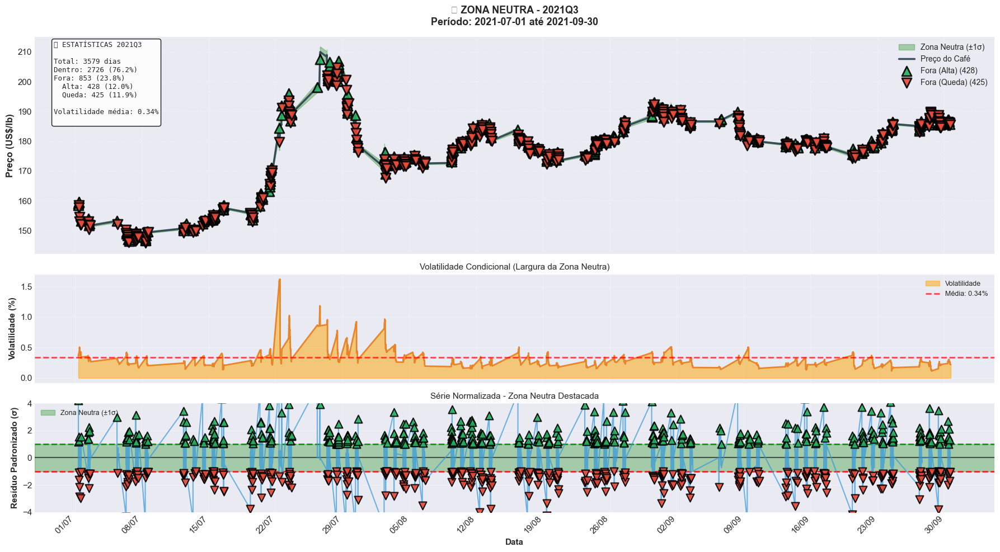


[4/21] Plotando trimestre 2021Q4...
  ✓ Salvo: zona_neutra_trimestre_2021Q4.png


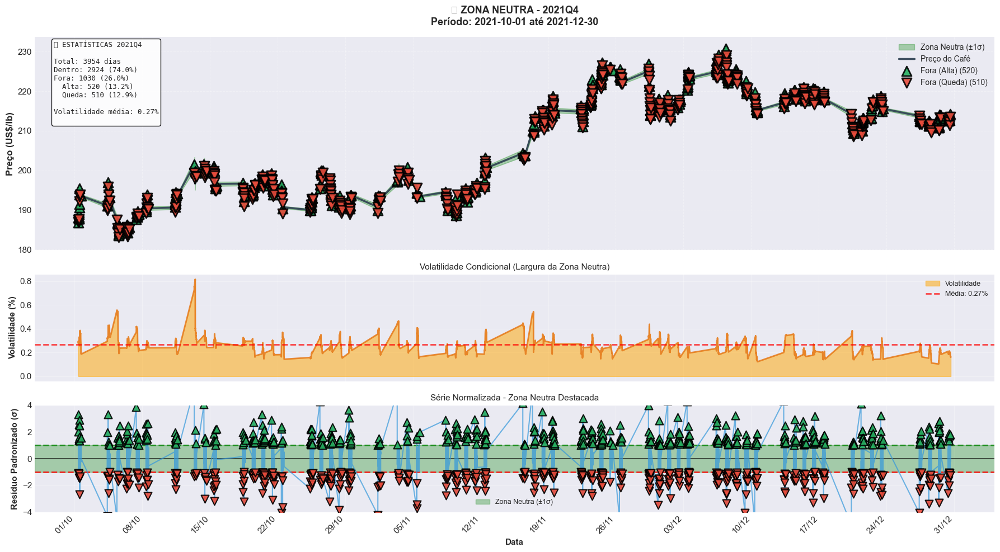


[5/21] Plotando trimestre 2022Q1...
  ✓ Salvo: zona_neutra_trimestre_2022Q1.png


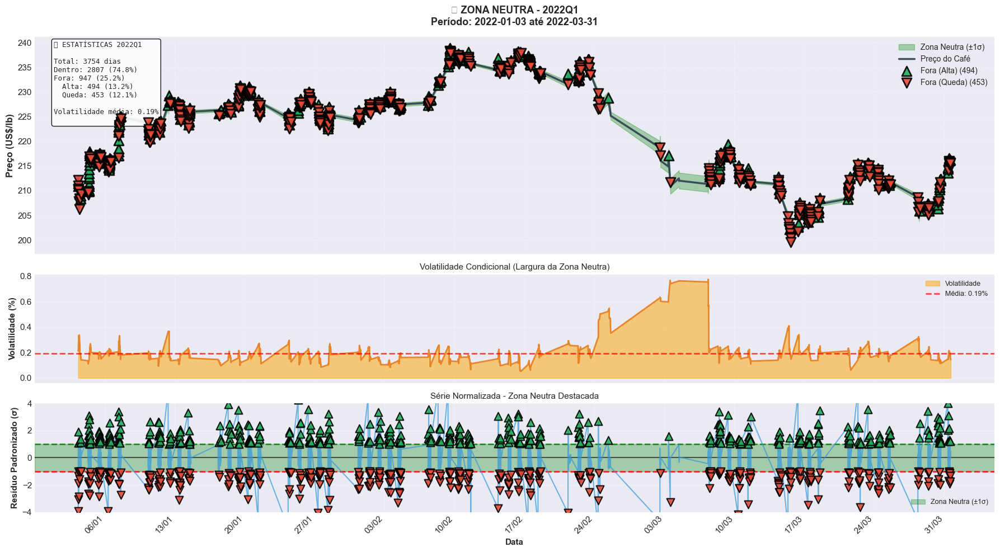


[6/21] Plotando trimestre 2022Q2...
  ✓ Salvo: zona_neutra_trimestre_2022Q2.png


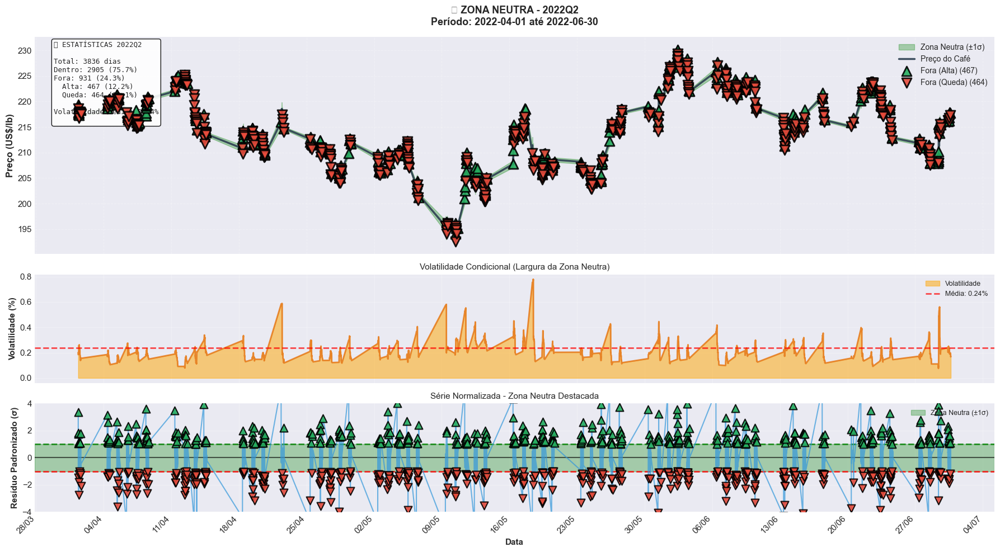


[7/21] Plotando trimestre 2022Q3...
  ✓ Salvo: zona_neutra_trimestre_2022Q3.png


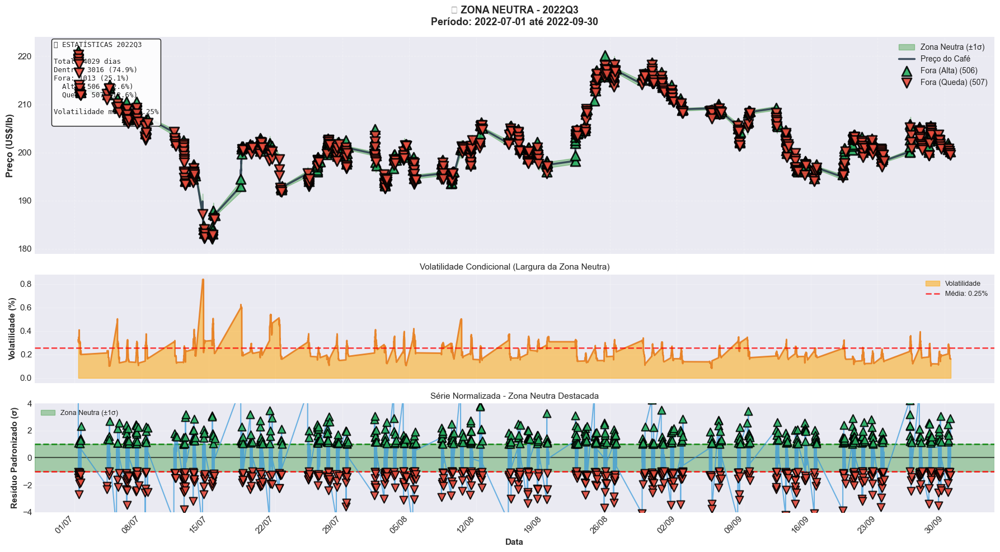


[8/21] Plotando trimestre 2022Q4...
  ✓ Salvo: zona_neutra_trimestre_2022Q4.png


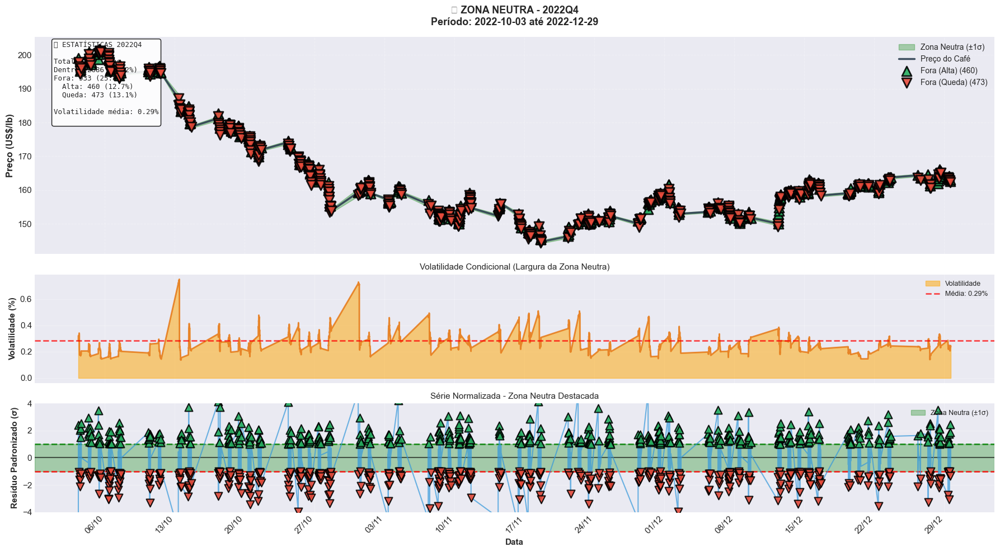


[9/21] Plotando trimestre 2023Q1...
  ✓ Salvo: zona_neutra_trimestre_2023Q1.png


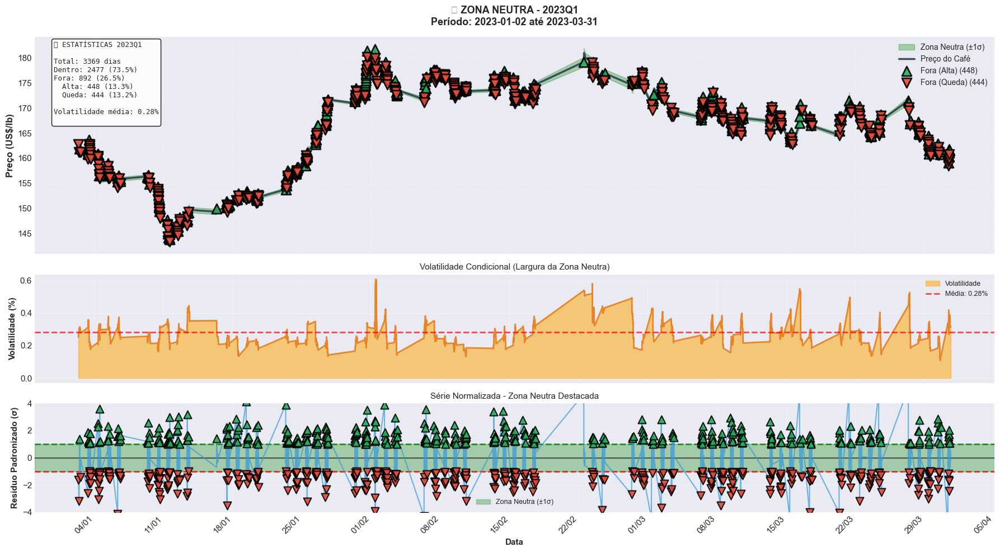


[10/21] Plotando trimestre 2023Q2...
  ✓ Salvo: zona_neutra_trimestre_2023Q2.png


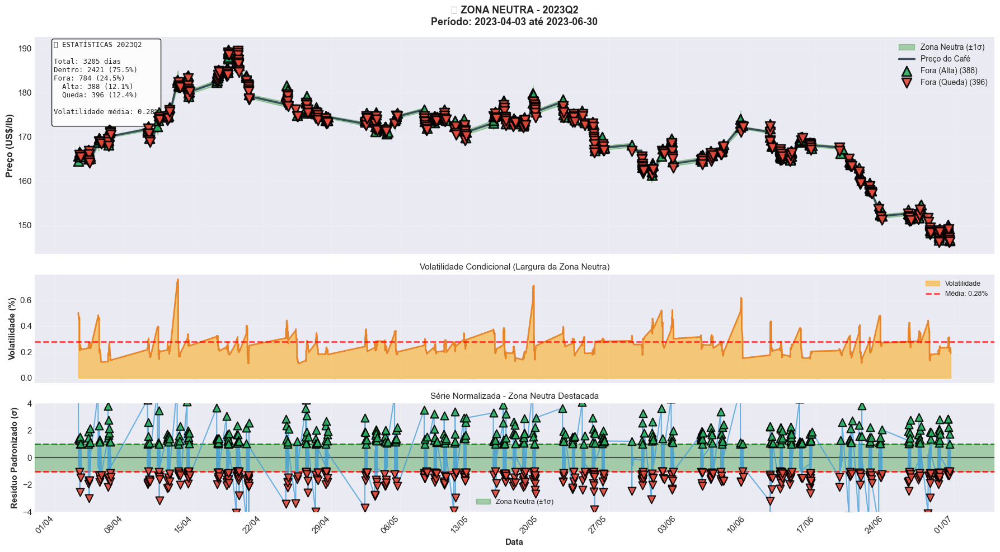


[11/21] Plotando trimestre 2023Q3...
  ✓ Salvo: zona_neutra_trimestre_2023Q3.png


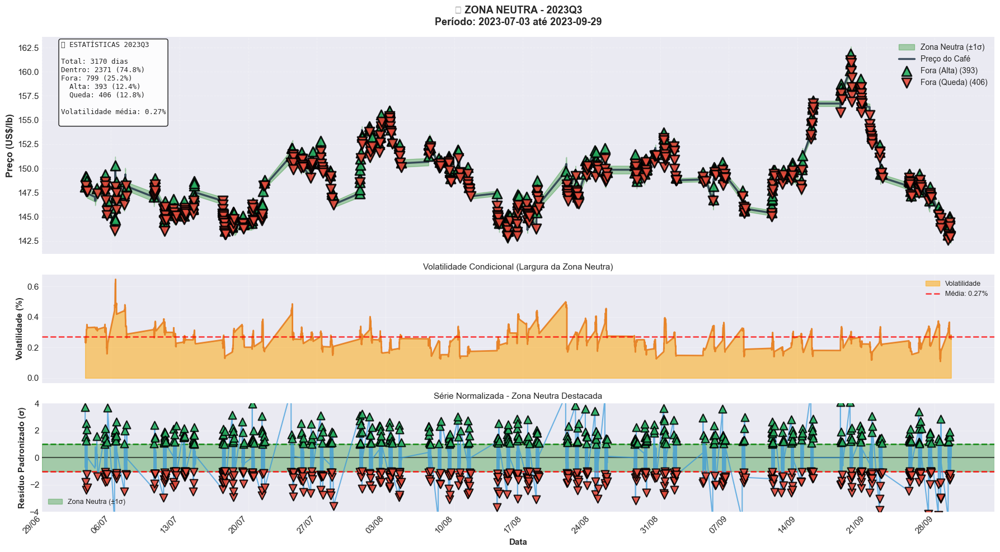


[12/21] Plotando trimestre 2023Q4...
  ✓ Salvo: zona_neutra_trimestre_2023Q4.png


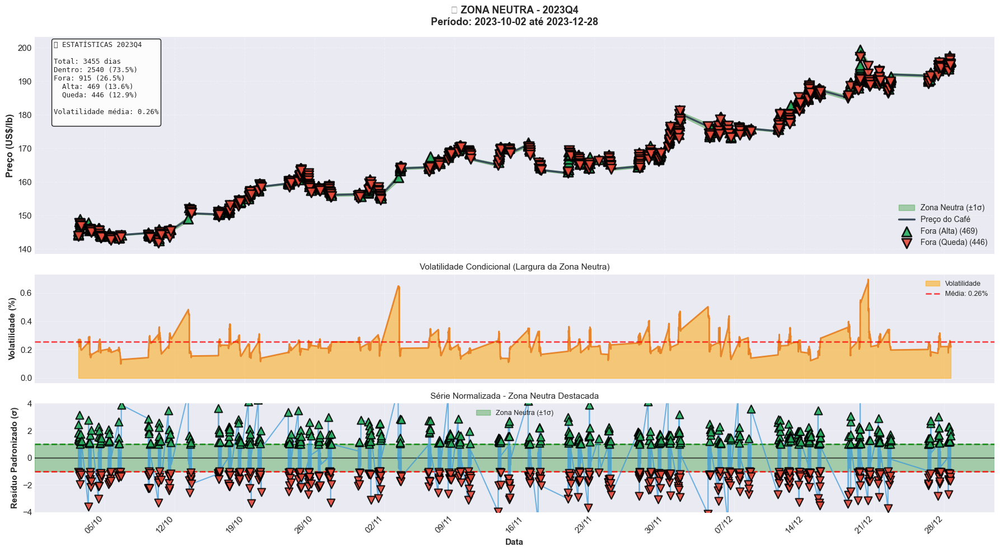


[13/21] Plotando trimestre 2024Q1...
  ✓ Salvo: zona_neutra_trimestre_2024Q1.png


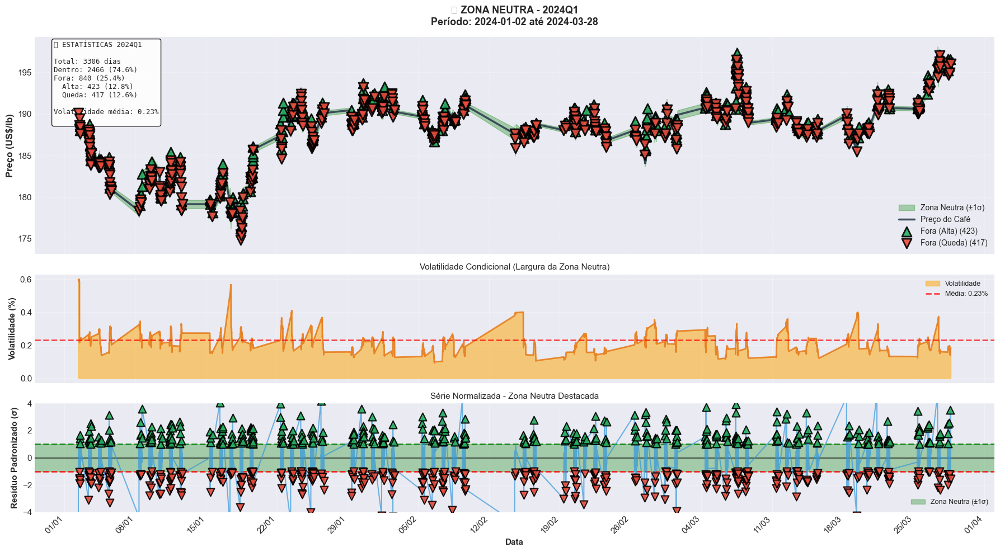


[14/21] Plotando trimestre 2024Q2...
  ✓ Salvo: zona_neutra_trimestre_2024Q2.png


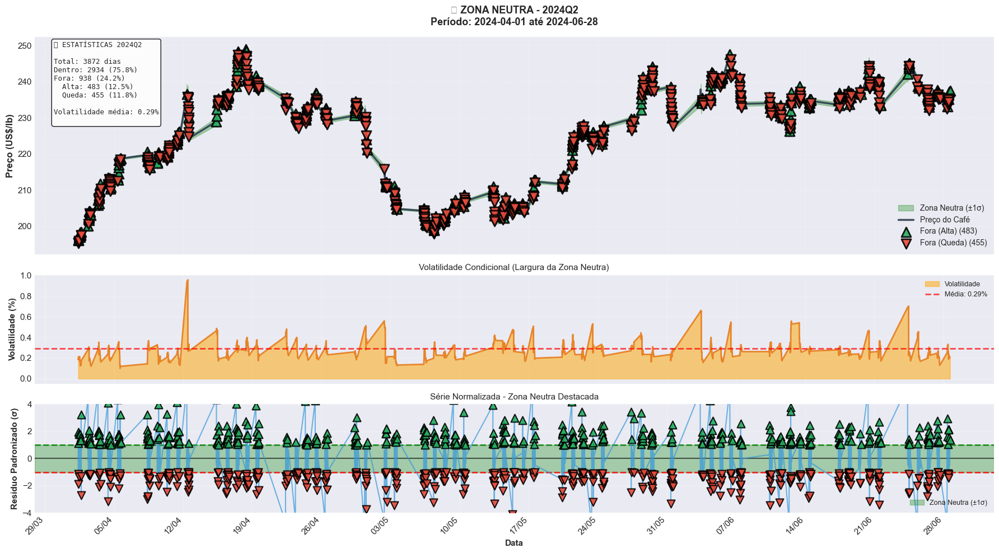


[15/21] Plotando trimestre 2024Q3...
  ✓ Salvo: zona_neutra_trimestre_2024Q3.png


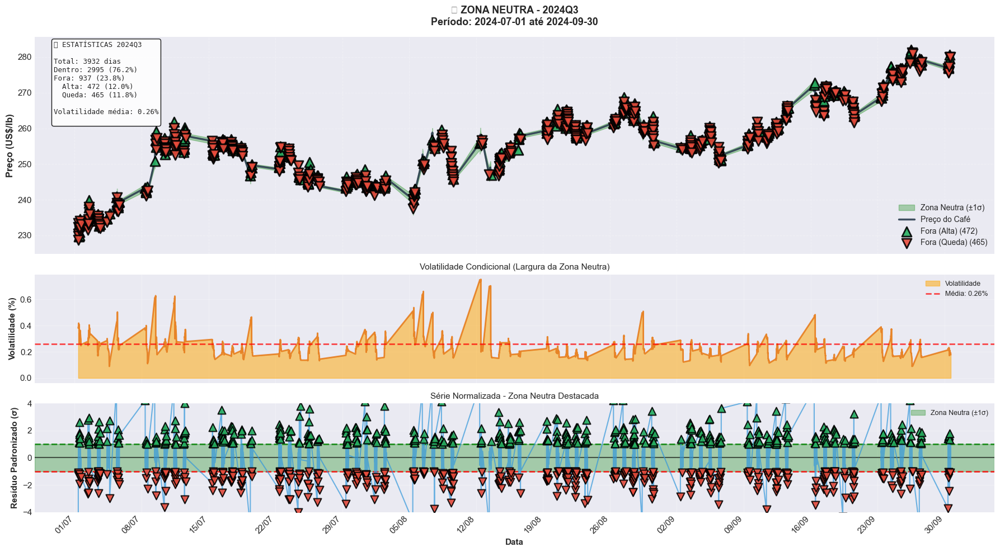


[16/21] Plotando trimestre 2024Q4...
  ✓ Salvo: zona_neutra_trimestre_2024Q4.png


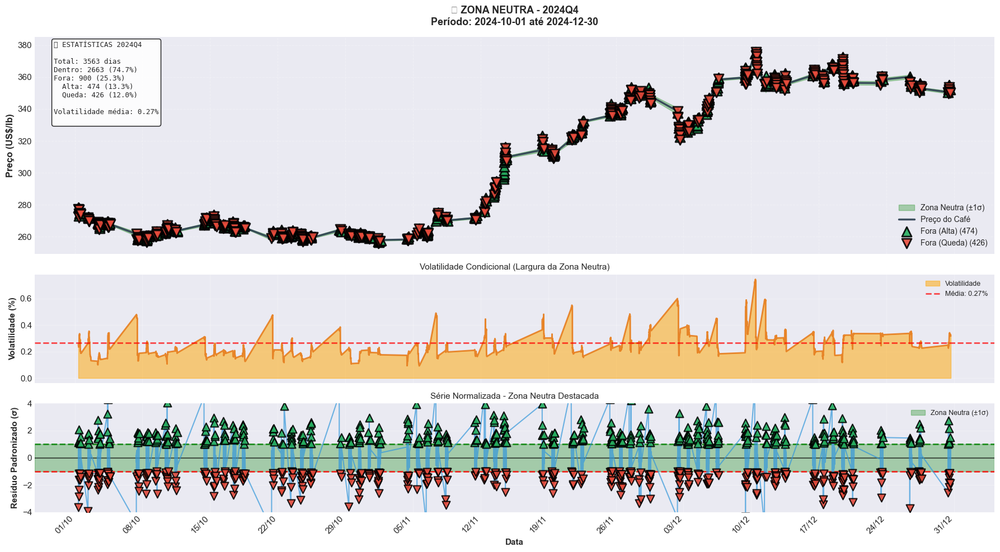


[17/21] Plotando trimestre 2025Q1...
  ✓ Salvo: zona_neutra_trimestre_2025Q1.png


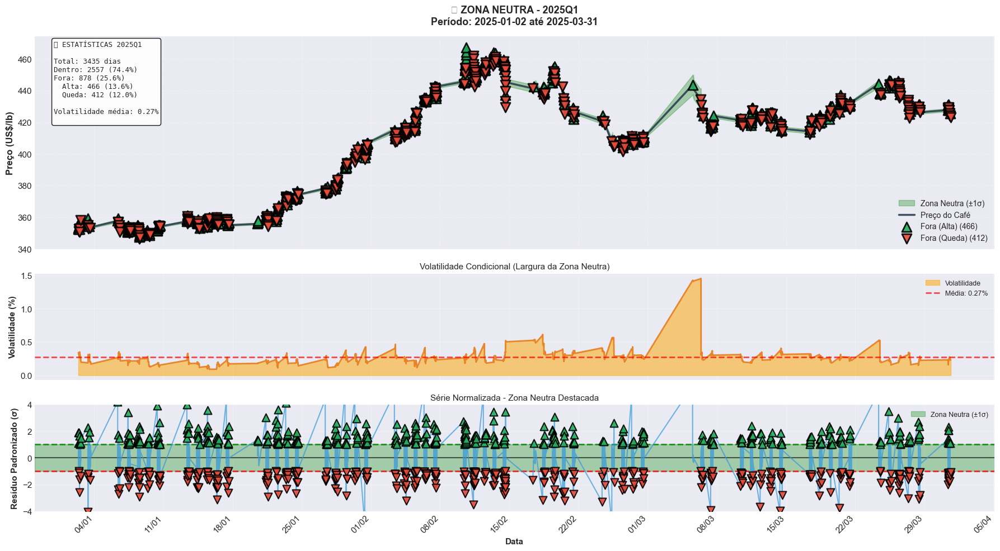


[18/21] Plotando trimestre 2025Q2...
  ✓ Salvo: zona_neutra_trimestre_2025Q2.png


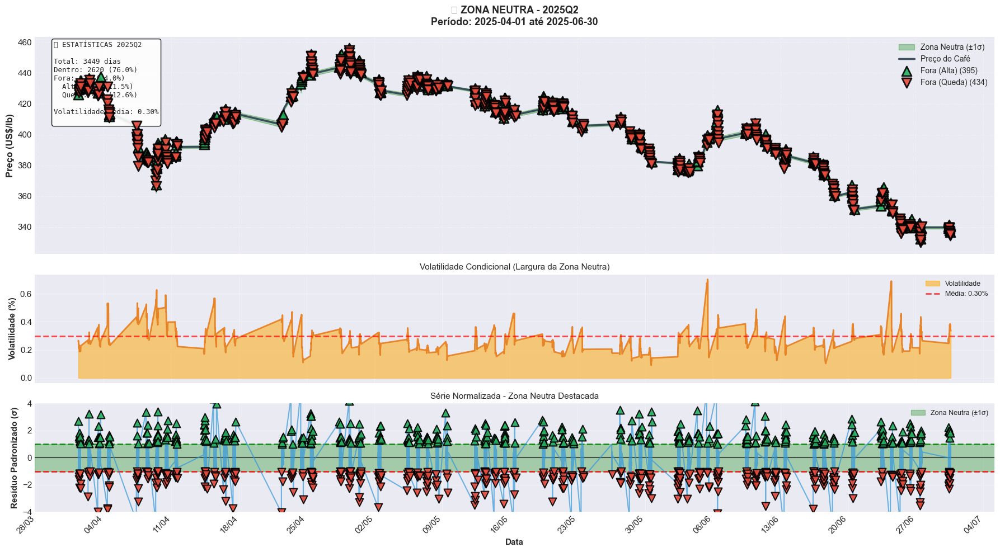


[19/21] Plotando trimestre 2025Q3...
  ✓ Salvo: zona_neutra_trimestre_2025Q3.png


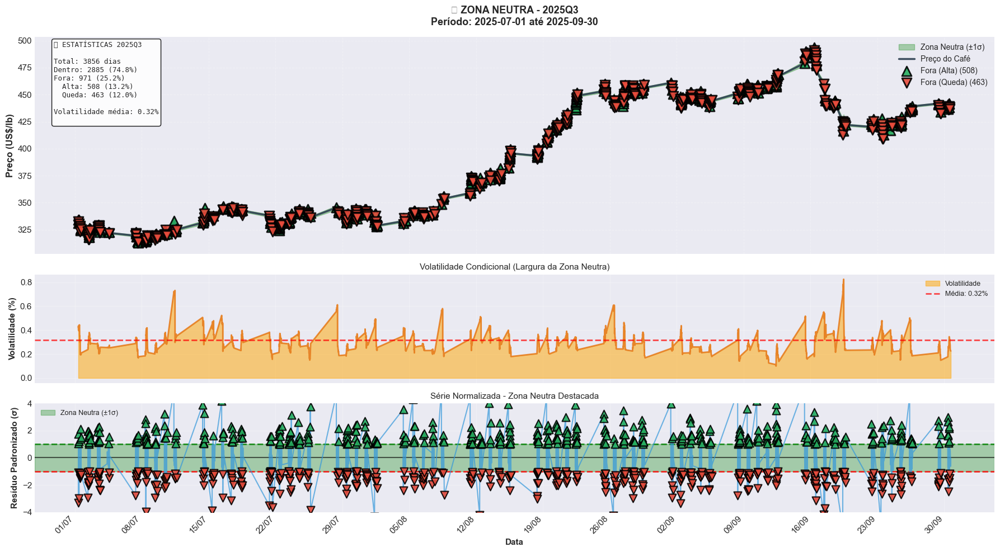


[20/21] Plotando trimestre 2025Q4...
  ✓ Salvo: zona_neutra_trimestre_2025Q4.png


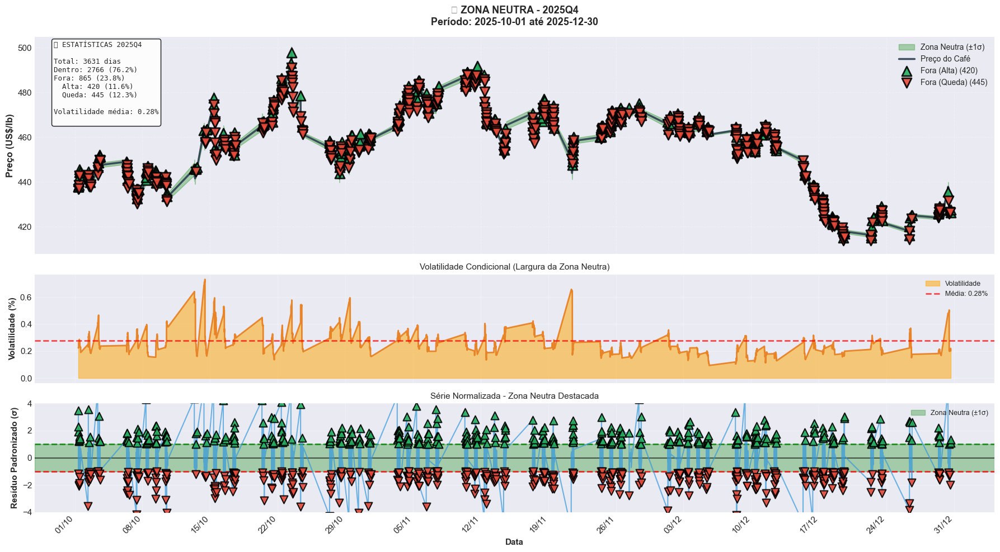


[21/21] Plotando trimestre 2026Q1...
  ✓ Salvo: zona_neutra_trimestre_2026Q1.png


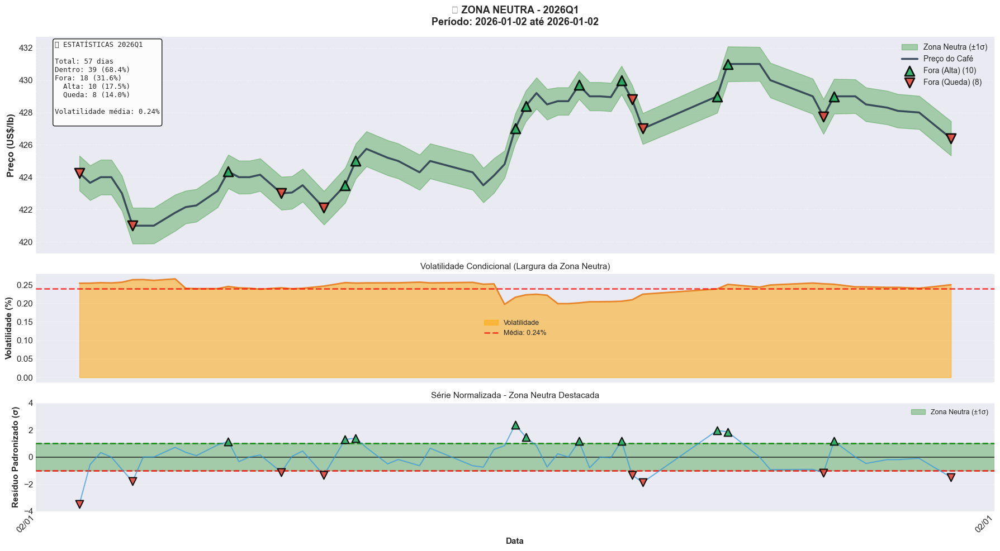


✅ Visualizações trimestrais concluídas!

💾 Arquivos salvos:
   • zona_neutra_grid_trimestres.png (todos os trimestres em uma imagem)
   • zona_neutra_trimestre_YYYYQN.png (um arquivo para cada trimestre)

🎯 FOCO: Visualização detalhada da ZONA NEUTRA por trimestre
   Agora você pode ver os detalhes de cada período!


In [6]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.dates as mdates
from datetime import timedelta
import warnings
warnings.filterwarnings('ignore')

# Configurações de visualização
plt.style.use('seaborn-v0_8-darkgrid')
plt.rcParams['figure.figsize'] = (20, 12)
plt.rcParams['font.size'] = 11

print("="*80)
print("VISUALIZAÇÃO DA ZONA NEUTRA GARCH")
print("Foco: Região onde |variação| < 1σ (desvio padrão)")
print("="*80)

# =============================================================================
# CARREGAR DADOS
# =============================================================================

# Série temporal original
series_df = pd.read_csv('../dataset/M5_ICF$.csv', sep='\t')
series_df['Time'] = pd.to_datetime(series_df['Time'], format='%Y.%m.%d %H:%M:%S')
series_df = series_df.sort_values('Time').reset_index(drop=True)

# Calcular log-retornos
series_df['log_return'] = np.log(series_df['Close'] / series_df['Close'].shift(1))

# Calcular volatilidade rolling (proxy para GARCH)
series_df['vol_rolling'] = series_df['log_return'].rolling(30, min_periods=10).std()
series_df['vol_rolling'].fillna(series_df['log_return'].std(), inplace=True)

# Calcular resíduos padronizados
series_df['std_residual'] = series_df['log_return'] / series_df['vol_rolling']

# Calcular limites da zona neutra (necessário para visualizações)
series_df['upper_neutral'] = series_df['Close'] * (1 + 1.0 * series_df['vol_rolling'])
series_df['lower_neutral'] = series_df['Close'] * (1 - 1.0 * series_df['vol_rolling'])

print(f"\n✓ Série temporal: {len(series_df)} registros")
print(f"✓ Período: {series_df['Time'].min().date()} até {series_df['Time'].max().date()}")
print(f"✓ Desvio padrão dos resíduos: {series_df['std_residual'].std():.3f} (deve ser ~1.0)")

# =============================================================================
# FUNÇÃO 1: VISUALIZAR ZONA NEUTRA COM FAIXA SOMBREADA
# =============================================================================

def plot_neutral_zone_simple(threshold=1.0, save_fig=False):
    """
    Visualização simples: série de preços com ZONA NEUTRA sombreada
    """
    print(f"\n{'='*80}")
    print(f"VISUALIZAÇÃO DA ZONA NEUTRA (Threshold: ±{threshold}σ)")
    print(f"{'='*80}")
    
    fig, axes = plt.subplots(2, 1, figsize=(20, 10), sharex=True,
                             gridspec_kw={'height_ratios': [2, 1]})
    
    ax1, ax2 = axes
    
    # =========================================================================
    # SUBPLOT 1: PREÇO COM ZONA NEUTRA
    # =========================================================================
    
    # Calcular limites da zona neutra em termos de preço
    # Zona neutra = onde a variação esperada está entre ±1σ
    mean_price = series_df['Close'].mean()
    
    # Para cada ponto, calcular banda neutra
    series_df['upper_neutral'] = series_df['Close'] * (1 + threshold * series_df['vol_rolling'])
    series_df['lower_neutral'] = series_df['Close'] * (1 - threshold * series_df['vol_rolling'])
    
    # Plotar zona neutra (fundo verde)
    ax1.fill_between(series_df['Time'], 
                     series_df['lower_neutral'],
                     series_df['upper_neutral'],
                     alpha=0.25, color='green', 
                     label=f'Zona Neutra (±{threshold}σ)', zorder=1)
    
    # Plotar preço
    ax1.plot(series_df['Time'], series_df['Close'],
            linewidth=2.5, color='#2C3E50', label='Preço do Café',
            alpha=0.9, zorder=3)
    
    # Destacar pontos FORA da zona neutra
    outside_neutral = series_df[series_df['std_residual'].abs() > threshold].copy()
    
    # Separar em altas e quedas
    outside_up = outside_neutral[outside_neutral['std_residual'] > 0]
    outside_down = outside_neutral[outside_neutral['std_residual'] < 0]
    
    ax1.scatter(outside_up['Time'], outside_up['Close'],
               color='#27AE60', marker='^', s=100, alpha=0.8,
               edgecolors='black', linewidths=1.5,
               label=f'Fora da zona (Alta) ({len(outside_up)})', zorder=5)
    
    ax1.scatter(outside_down['Time'], outside_down['Close'],
               color='#E74C3C', marker='v', s=100, alpha=0.8,
               edgecolors='black', linewidths=1.5,
               label=f'Fora da zona (Queda) ({len(outside_down)})', zorder=5)
    
    ax1.set_ylabel('Preço (US$/lb)', fontsize=13, fontweight='bold')
    ax1.set_title(f'🎯 ZONA NEUTRA GARCH - Área onde |variação| < {threshold}σ\n' + 
                 f'(Verde = Comportamento Normal | Vermelho/Verde escuro = Movimentos Anormais)',
                 fontsize=14, fontweight='bold', pad=15)
    ax1.legend(loc='best', fontsize=11, framealpha=0.95, shadow=True)
    ax1.grid(True, alpha=0.3, linestyle='--')
    
    # Estatísticas na imagem
    total_points = len(series_df.dropna())
    neutral_points = len(series_df[series_df['std_residual'].abs() <= threshold])
    neutral_pct = (neutral_points / total_points) * 100
    
    stats_text = f"""📊 ESTATÍSTICAS DA ZONA NEUTRA
    
Total de pontos: {total_points}
Dentro da zona: {neutral_points} ({neutral_pct:.1f}%)
Fora da zona: {total_points - neutral_points} ({100 - neutral_pct:.1f}%)
  • Altas: {len(outside_up)} ({len(outside_up)/total_points*100:.1f}%)
  • Quedas: {len(outside_down)} ({len(outside_down)/total_points*100:.1f}%)

Threshold: ±{threshold} desvios padrão
"""
    
    ax1.text(0.02, 0.98, stats_text,
            transform=ax1.transAxes,
            fontsize=10,
            verticalalignment='top',
            bbox=dict(boxstyle='round', facecolor='white', alpha=0.9, edgecolor='black'),
            family='monospace')
    
    # =========================================================================
    # SUBPLOT 2: RESÍDUOS PADRONIZADOS COM ZONA NEUTRA
    # =========================================================================
    
    # Área da zona neutra
    ax2.axhspan(-threshold, threshold, alpha=0.25, color='green', 
               label=f'Zona Neutra (±{threshold}σ)', zorder=1)
    
    # Linhas de threshold
    ax2.axhline(threshold, color='green', linestyle='--', linewidth=2.5, 
               alpha=0.8, zorder=2)
    ax2.axhline(-threshold, color='red', linestyle='--', linewidth=2.5, 
               alpha=0.8, zorder=2)
    ax2.axhline(0, color='black', linestyle='-', linewidth=1.5, alpha=0.6)
    
    # Plotar resíduos
    ax2.plot(series_df['Time'], series_df['std_residual'],
            linewidth=1.5, color='#3498DB', alpha=0.6, zorder=3)
    
    # Destacar pontos fora da zona
    ax2.scatter(outside_up['Time'], outside_up['std_residual'],
               color='#27AE60', marker='^', s=80, alpha=0.8,
               edgecolors='black', linewidths=1.5, zorder=5)
    
    ax2.scatter(outside_down['Time'], outside_down['std_residual'],
               color='#E74C3C', marker='v', s=80, alpha=0.8,
               edgecolors='black', linewidths=1.5, zorder=5)
    
    ax2.set_ylabel('Resíduo Padronizado (σ)', fontsize=12, fontweight='bold')
    ax2.set_xlabel('Data', fontsize=12, fontweight='bold')
    ax2.set_title('Série Normalizada por GARCH - Zona Neutra Destacada', 
                 fontsize=13, fontweight='bold')
    ax2.legend(loc='best', fontsize=10)
    ax2.grid(True, alpha=0.3, linestyle='--')
    ax2.set_ylim(-5, 5)  # Limitar para melhor visualização
    
    # Formatação do eixo X
    ax2.xaxis.set_major_formatter(mdates.DateFormatter('%m/%Y'))
    plt.setp(ax2.xaxis.get_majorticklabels(), rotation=45)
    
    plt.tight_layout()
    
    if save_fig:
        filename = f'zona_neutra_simples_threshold_{threshold}.png'
        plt.savefig(filename, dpi=300, bbox_inches='tight')
        print(f"✓ Gráfico salvo: {filename}")
    
    plt.show()

# =============================================================================
# FUNÇÃO 2: MAPA DE CALOR DA ZONA NEUTRA
# =============================================================================

def plot_neutral_heatmap(save_fig=False):
    """
    Mapa de calor mostrando intensidade da zona neutra ao longo do tempo
    """
    print(f"\n{'='*80}")
    print(f"MAPA DE CALOR DA ZONA NEUTRA")
    print(f"{'='*80}")
    
    fig, axes = plt.subplots(3, 1, figsize=(20, 12), sharex=True)
    
    # =========================================================================
    # SUBPLOT 1: PREÇO
    # =========================================================================
    
    ax1 = axes[0]
    ax1.plot(series_df['Time'], series_df['Close'],
            linewidth=2, color='#2C3E50', alpha=0.8)
    ax1.set_ylabel('Preço (US$/lb)', fontsize=12, fontweight='bold')
    ax1.set_title('📈 Preço do Café', fontsize=13, fontweight='bold')
    ax1.grid(True, alpha=0.3)
    
    # =========================================================================
    # SUBPLOT 2: VOLATILIDADE (LARGURA DA ZONA NEUTRA)
    # =========================================================================
    
    ax2 = axes[1]
    
    # Plotar volatilidade em %
    ax2.fill_between(series_df['Time'], 0, series_df['vol_rolling'] * 100,
                     alpha=0.6, color='orange', label='Volatilidade GARCH')
    ax2.plot(series_df['Time'], series_df['vol_rolling'] * 100,
            linewidth=2, color='#E67E22', alpha=0.9)
    
    ax2.set_ylabel('Volatilidade (%)', fontsize=12, fontweight='bold')
    ax2.set_title('📊 Volatilidade Condicional (Largura da Zona Neutra)', 
                 fontsize=13, fontweight='bold')
    ax2.legend(loc='best', fontsize=10)
    ax2.grid(True, alpha=0.3)
    
    # =========================================================================
    # SUBPLOT 3: STATUS NEUTRA (MAPA DE CALOR)
    # =========================================================================
    
    ax3 = axes[2]
    
    # Criar classificação: -1 (queda), 0 (neutro), +1 (alta)
    series_df['status'] = 0  # Neutro por padrão
    series_df.loc[series_df['std_residual'] > 1.0, 'status'] = 1   # Alta
    series_df.loc[series_df['std_residual'] < -1.0, 'status'] = -1  # Queda
    
    # Criar mapa de cores
    colors_map = {-1: '#E74C3C', 0: '#95A5A6', 1: '#27AE60'}
    
    # Plotar como barras verticais
    for idx, row in series_df.iterrows():
        if pd.notna(row['status']):
            color = colors_map[row['status']]
            ax3.axvline(row['Time'], color=color, alpha=0.6, linewidth=0.5)
    
    # Adicionar linha base
    ax3.axhline(0, color='black', linewidth=2, alpha=0.8)
    
    # Plotar intensidade (valor absoluto dos resíduos)
    ax3.fill_between(series_df['Time'], 
                     0,
                     series_df['std_residual'].abs(),
                     alpha=0.4, color='gray')
    
    ax3.set_ylabel('|Intensidade| (σ)', fontsize=12, fontweight='bold')
    ax3.set_xlabel('Data', fontsize=12, fontweight='bold')
    ax3.set_title('🎨 Mapa de Status: Verde=Zona Neutra | Vermelho=Queda | Verde Escuro=Alta',
                 fontsize=13, fontweight='bold')
    ax3.set_ylim(0, 4)
    ax3.grid(True, alpha=0.3)
    
    # Formatação
    ax3.xaxis.set_major_formatter(mdates.DateFormatter('%m/%Y'))
    plt.setp(ax3.xaxis.get_majorticklabels(), rotation=45)
    
    plt.tight_layout()
    
    if save_fig:
        filename = 'zona_neutra_heatmap.png'
        plt.savefig(filename, dpi=300, bbox_inches='tight')
        print(f"✓ Gráfico salvo: {filename}")
    
    plt.show()

# =============================================================================
# FUNÇÃO 3: ANÁLISE DETALHADA DA ZONA NEUTRA
# =============================================================================

def plot_neutral_analysis(save_fig=False):
    """
    Análise detalhada: características da zona neutra
    """
    print(f"\n{'='*80}")
    print(f"ANÁLISE DETALHADA DA ZONA NEUTRA")
    print(f"{'='*80}")
    
    fig = plt.figure(figsize=(20, 12))
    gs = fig.add_gridspec(3, 3, hspace=0.3, wspace=0.3)
    
    # =========================================================================
    # GRÁFICO 1: HISTOGRAMA DOS RESÍDUOS
    # =========================================================================
    
    ax1 = fig.add_subplot(gs[0, 0])
    
    # Histograma completo
    n, bins, patches = ax1.hist(series_df['std_residual'].dropna(), 
                                bins=50, alpha=0.7, color='gray', 
                                edgecolor='black', density=True)
    
    # Colorir zona neutra
    for i, patch in enumerate(patches):
        if -1.0 <= bins[i] <= 1.0:
            patch.set_facecolor('green')
            patch.set_alpha(0.7)
    
    # Curva normal teórica
    mu, sigma = 0, 1
    x = np.linspace(-5, 5, 100)
    ax1.plot(x, 1/(sigma * np.sqrt(2 * np.pi)) * np.exp(-0.5 * ((x - mu)/sigma)**2),
            'r--', linewidth=2, label='Normal(0,1) Teórica')
    
    ax1.axvline(-1, color='red', linestyle='--', linewidth=2, alpha=0.7)
    ax1.axvline(1, color='green', linestyle='--', linewidth=2, alpha=0.7)
    ax1.axvline(0, color='black', linestyle='-', linewidth=1.5)
    
    ax1.set_xlabel('Resíduo Padronizado (σ)', fontsize=10, fontweight='bold')
    ax1.set_ylabel('Densidade', fontsize=10, fontweight='bold')
    ax1.set_title('Distribuição dos Resíduos\n(Verde = Zona Neutra)', 
                 fontsize=11, fontweight='bold')
    ax1.legend(fontsize=9)
    ax1.grid(True, alpha=0.3)
    ax1.set_xlim(-5, 5)
    
    # =========================================================================
    # GRÁFICO 2: PERCENTUAL NA ZONA NEUTRA AO LONGO DO TEMPO
    # =========================================================================
    
    ax2 = fig.add_subplot(gs[0, 1:])
    
    # Calcular percentual na zona neutra em janelas móveis
    window = 90  # 90 dias
    series_df['is_neutral'] = (series_df['std_residual'].abs() <= 1.0).astype(int)
    series_df['neutral_pct'] = series_df['is_neutral'].rolling(window).mean() * 100
    
    ax2.plot(series_df['Time'], series_df['neutral_pct'],
            linewidth=2.5, color='#27AE60', alpha=0.8, label=f'% Neutro (janela {window}d)')
    
    ax2.axhline(50, color='red', linestyle='--', linewidth=2, alpha=0.5, 
               label='Linha de 50%')
    ax2.fill_between(series_df['Time'], 0, series_df['neutral_pct'],
                     alpha=0.3, color='green')
    
    ax2.set_ylabel('% na Zona Neutra', fontsize=11, fontweight='bold')
    ax2.set_title(f'Percentual de Pontos na Zona Neutra ao Longo do Tempo\n(Janela móvel de {window} dias)',
                 fontsize=12, fontweight='bold')
    ax2.legend(loc='best', fontsize=10)
    ax2.grid(True, alpha=0.3)
    ax2.set_ylim(0, 100)
    
    # =========================================================================
    # GRÁFICO 3: TEMPO DENTRO vs FORA DA ZONA
    # =========================================================================
    
    ax3 = fig.add_subplot(gs[1, 0])
    
    # Contar eventos
    inside = (series_df['std_residual'].abs() <= 1.0).sum()
    outside_up = (series_df['std_residual'] > 1.0).sum()
    outside_down = (series_df['std_residual'] < -1.0).sum()
    
    data = [inside, outside_up, outside_down]
    labels = ['Dentro da\nZona Neutra', 'Fora (Alta)', 'Fora (Queda)']
    colors_pie = ['#95A5A6', '#27AE60', '#E74C3C']
    
    wedges, texts, autotexts = ax3.pie(data, labels=labels, colors=colors_pie,
                                        autopct='%1.1f%%', startangle=90,
                                        explode=[0.05, 0, 0])
    
    for autotext in autotexts:
        autotext.set_color('white')
        autotext.set_fontsize(11)
        autotext.set_fontweight('bold')
    
    ax3.set_title('Distribuição do Tempo', fontsize=11, fontweight='bold')
    
    # =========================================================================
    # GRÁFICO 4: VOLATILIDADE vs STATUS
    # =========================================================================
    
    ax4 = fig.add_subplot(gs[1, 1])
    
    # Volatilidade para cada status
    neutral_vol = series_df[series_df['std_residual'].abs() <= 1.0]['vol_rolling'] * 100
    high_vol = series_df[series_df['std_residual'] > 1.0]['vol_rolling'] * 100
    low_vol = series_df[series_df['std_residual'] < -1.0]['vol_rolling'] * 100
    
    data_box = [neutral_vol.dropna(), high_vol.dropna(), low_vol.dropna()]
    
    bp = ax4.boxplot(data_box, labels=['Neutro', 'Alta', 'Queda'],
                     patch_artist=True, notch=True, showmeans=True)
    
    for patch, color in zip(bp['boxes'], ['#95A5A6', '#27AE60', '#E74C3C']):
        patch.set_facecolor(color)
        patch.set_alpha(0.7)
    
    ax4.set_ylabel('Volatilidade (%)', fontsize=10, fontweight='bold')
    ax4.set_title('Volatilidade por Status', fontsize=11, fontweight='bold')
    ax4.grid(True, alpha=0.3, axis='y')
    
    # =========================================================================
    # GRÁFICO 5: DURAÇÃO DOS PERÍODOS NEUTROS
    # =========================================================================
    
    ax5 = fig.add_subplot(gs[1, 2])
    
    # Calcular duração de períodos contínuos neutros
    series_df['neutral_block'] = (series_df['is_neutral'] != 
                                  series_df['is_neutral'].shift()).cumsum()
    
    durations = []
    for block_id in series_df[series_df['is_neutral'] == 1]['neutral_block'].unique():
        duration = len(series_df[series_df['neutral_block'] == block_id])
        durations.append(duration)
    
    if len(durations) > 0:
        ax5.hist(durations, bins=30, alpha=0.7, color='green', 
                edgecolor='black', density=False)
        ax5.axvline(np.mean(durations), color='red', linestyle='--', 
                   linewidth=2, label=f'Média: {np.mean(durations):.1f} dias')
    
    ax5.set_xlabel('Duração (dias)', fontsize=10, fontweight='bold')
    ax5.set_ylabel('Frequência', fontsize=10, fontweight='bold')
    ax5.set_title('Duração de Períodos Neutros\nContínuos', fontsize=11, fontweight='bold')
    ax5.legend(fontsize=9)
    ax5.grid(True, alpha=0.3)
    
    # =========================================================================
    # GRÁFICO 6: SÉRIE COMPLETA COM ZONA
    # =========================================================================
    
    ax6 = fig.add_subplot(gs[2, :])
    
    # Zona neutra
    ax6.fill_between(series_df['Time'],
                     series_df['Close'] * (1 - series_df['vol_rolling']),
                     series_df['Close'] * (1 + series_df['vol_rolling']),
                     alpha=0.25, color='green', label='Zona Neutra (±1σ)', zorder=1)
    
    # Preço
    ax6.plot(series_df['Time'], series_df['Close'],
            linewidth=2, color='#2C3E50', alpha=0.9, zorder=3)
    
    # Marcar pontos fora da zona
    outside = series_df[series_df['std_residual'].abs() > 1.0]
    ax6.scatter(outside['Time'], outside['Close'],
               c=['#27AE60' if x > 0 else '#E74C3C' for x in outside['std_residual']],
               marker='o', s=30, alpha=0.8, edgecolors='black', linewidths=0.5, zorder=5)
    
    ax6.set_ylabel('Preço (US$/lb)', fontsize=11, fontweight='bold')
    ax6.set_xlabel('Data', fontsize=11, fontweight='bold')
    ax6.set_title('Série Completa com Zona Neutra Destacada', fontsize=12, fontweight='bold')
    ax6.legend(loc='best', fontsize=10)
    ax6.grid(True, alpha=0.3)
    ax6.xaxis.set_major_formatter(mdates.DateFormatter('%m/%Y'))
    plt.setp(ax6.xaxis.get_majorticklabels(), rotation=45)
    
    plt.suptitle('📊 ANÁLISE COMPLETA DA ZONA NEUTRA GARCH', 
                fontsize=16, fontweight='bold', y=0.995)
    
    plt.tight_layout()
    
    if save_fig:
        filename = 'zona_neutra_analise_completa.png'
        plt.savefig(filename, dpi=300, bbox_inches='tight')
        print(f"✓ Gráfico salvo: {filename}")
    
    plt.show()

# =============================================================================
# FUNÇÃO 4: ZONA NEUTRA POR TRIMESTRE
# =============================================================================

def plot_neutral_zone_quarterly(save_fig=False):
    """
    Plota zona neutra separada por trimestre para melhor visualização
    """
    print(f"\n{'='*80}")
    print(f"VISUALIZAÇÃO DA ZONA NEUTRA POR TRIMESTRE")
    print(f"{'='*80}")
    
    # Adicionar trimestre
    series_df['quarter'] = series_df['Time'].dt.to_period('Q')
    quarters = sorted(series_df['quarter'].unique())
    
    print(f"\nTotal de trimestres: {len(quarters)}")
    
    for i, quarter in enumerate(quarters, 1):
        print(f"\n[{i}/{len(quarters)}] Plotando trimestre {quarter}...")
        
        # Filtrar dados do trimestre
        quarter_data = series_df[series_df['quarter'] == quarter].copy()
        
        if len(quarter_data) < 10:
            print(f"  ⚠ Poucos dados para {quarter}, pulando...")
            continue
        
        # Criar figura
        fig, axes = plt.subplots(3, 1, figsize=(18, 10), sharex=True,
                                gridspec_kw={'height_ratios': [2, 1, 1]})
        
        ax1, ax2, ax3 = axes
        
        # =====================================================================
        # SUBPLOT 1: PREÇO COM ZONA NEUTRA
        # =====================================================================
        
        # Zona neutra
        ax1.fill_between(quarter_data['Time'], 
                         quarter_data['lower_neutral'],
                         quarter_data['upper_neutral'],
                         alpha=0.3, color='green', 
                         label='Zona Neutra (±1σ)', zorder=1)
        
        # Preço
        ax1.plot(quarter_data['Time'], quarter_data['Close'],
                linewidth=2.5, color='#2C3E50', label='Preço do Café',
                alpha=0.9, zorder=3)
        
        # Pontos fora da zona
        outside = quarter_data[quarter_data['std_residual'].abs() > 1.0]
        outside_up = outside[outside['std_residual'] > 0]
        outside_down = outside[outside['std_residual'] < 0]
        
        if len(outside_up) > 0:
            ax1.scatter(outside_up['Time'], outside_up['Close'],
                       color='#27AE60', marker='^', s=150, alpha=0.9,
                       edgecolors='black', linewidths=2,
                       label=f'Fora (Alta) ({len(outside_up)})', zorder=5)
        
        if len(outside_down) > 0:
            ax1.scatter(outside_down['Time'], outside_down['Close'],
                       color='#E74C3C', marker='v', s=150, alpha=0.9,
                       edgecolors='black', linewidths=2,
                       label=f'Fora (Queda) ({len(outside_down)})', zorder=5)
        
        ax1.set_ylabel('Preço (US$/lb)', fontsize=12, fontweight='bold')
        ax1.set_title(f'🎯 ZONA NEUTRA - {quarter}\n' + 
                     f'Período: {quarter_data["Time"].min().date()} até {quarter_data["Time"].max().date()}',
                     fontsize=13, fontweight='bold', pad=15)
        ax1.legend(loc='best', fontsize=10, framealpha=0.95, shadow=True)
        ax1.grid(True, alpha=0.3, linestyle='--')
        
        # Estatísticas do trimestre
        total = len(quarter_data.dropna())
        inside = (quarter_data['std_residual'].abs() <= 1.0).sum()
        inside_pct = (inside / total) * 100 if total > 0 else 0
        
        stats_text = f"""📊 ESTATÍSTICAS {quarter}

Total: {total} dias
Dentro: {inside} ({inside_pct:.1f}%)
Fora: {total - inside} ({100 - inside_pct:.1f}%)
  Alta: {len(outside_up)} ({len(outside_up)/total*100:.1f}%)
  Queda: {len(outside_down)} ({len(outside_down)/total*100:.1f}%)

Volatilidade média: {quarter_data['vol_rolling'].mean()*100:.2f}%
"""
        
        ax1.text(0.02, 0.98, stats_text,
                transform=ax1.transAxes,
                fontsize=9,
                verticalalignment='top',
                bbox=dict(boxstyle='round', facecolor='white', alpha=0.9, edgecolor='black'),
                family='monospace')
        
        # =====================================================================
        # SUBPLOT 2: VOLATILIDADE
        # =====================================================================
        
        ax2.fill_between(quarter_data['Time'], 0, quarter_data['vol_rolling'] * 100,
                        alpha=0.5, color='orange', label='Volatilidade')
        ax2.plot(quarter_data['Time'], quarter_data['vol_rolling'] * 100,
                linewidth=2, color='#E67E22', alpha=0.9)
        
        # Média do trimestre
        vol_mean = quarter_data['vol_rolling'].mean() * 100
        ax2.axhline(vol_mean, color='red', linestyle='--', linewidth=2,
                   alpha=0.7, label=f'Média: {vol_mean:.2f}%')
        
        ax2.set_ylabel('Volatilidade (%)', fontsize=11, fontweight='bold')
        ax2.set_title('Volatilidade Condicional (Largura da Zona Neutra)', fontsize=11)
        ax2.legend(loc='best', fontsize=9)
        ax2.grid(True, alpha=0.3)
        
        # =====================================================================
        # SUBPLOT 3: RESÍDUOS PADRONIZADOS
        # =====================================================================
        
        # Zona neutra
        ax3.axhspan(-1.0, 1.0, alpha=0.3, color='green', 
                   label='Zona Neutra (±1σ)', zorder=1)
        
        # Thresholds
        ax3.axhline(1.0, color='green', linestyle='--', linewidth=2, alpha=0.8, zorder=2)
        ax3.axhline(-1.0, color='red', linestyle='--', linewidth=2, alpha=0.8, zorder=2)
        ax3.axhline(0, color='black', linestyle='-', linewidth=1.5, alpha=0.6)
        
        # Resíduos
        ax3.plot(quarter_data['Time'], quarter_data['std_residual'],
                linewidth=1.5, color='#3498DB', alpha=0.7, zorder=3)
        
        # Pontos fora
        if len(outside_up) > 0:
            ax3.scatter(outside_up['Time'], outside_up['std_residual'],
                       color='#27AE60', marker='^', s=100, alpha=0.9,
                       edgecolors='black', linewidths=1.5, zorder=5)
        
        if len(outside_down) > 0:
            ax3.scatter(outside_down['Time'], outside_down['std_residual'],
                       color='#E74C3C', marker='v', s=100, alpha=0.9,
                       edgecolors='black', linewidths=1.5, zorder=5)
        
        ax3.set_ylabel('Resíduo Padronizado (σ)', fontsize=11, fontweight='bold')
        ax3.set_xlabel('Data', fontsize=11, fontweight='bold')
        ax3.set_title('Série Normalizada - Zona Neutra Destacada', fontsize=11)
        ax3.legend(loc='best', fontsize=9)
        ax3.grid(True, alpha=0.3)
        ax3.set_ylim(-4, 4)
        
        # Formatação do eixo X
        ax3.xaxis.set_major_formatter(mdates.DateFormatter('%d/%m'))
        ax3.xaxis.set_major_locator(mdates.DayLocator(interval=7))
        plt.setp(ax3.xaxis.get_majorticklabels(), rotation=45, ha='right')
        
        plt.tight_layout()
        
        if save_fig:
            filename = f'zona_neutra_trimestre_{quarter}.png'
            plt.savefig(filename, dpi=300, bbox_inches='tight')
            print(f"  ✓ Salvo: {filename}")
        
        plt.show()
        plt.close()

# =============================================================================
# FUNÇÃO 5: COMPARAÇÃO ENTRE TRIMESTRES (GRID)
# =============================================================================

def plot_neutral_zone_grid(save_fig=False):
    """
    Visualização em grid de todos os trimestres
    """
    print(f"\n{'='*80}")
    print(f"GRID DE COMPARAÇÃO - TODOS OS TRIMESTRES")
    print(f"{'='*80}")
    
    # Adicionar trimestre
    series_df['quarter'] = series_df['Time'].dt.to_period('Q')
    quarters = sorted(series_df['quarter'].unique())
    
    # Calcular grid
    n_quarters = len(quarters)
    n_cols = 4
    n_rows = (n_quarters + n_cols - 1) // n_cols
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 5*n_rows))
    axes = axes.flatten() if n_rows > 1 else [axes] if n_cols == 1 else axes
    
    for idx, quarter in enumerate(quarters):
        ax = axes[idx]
        
        # Filtrar dados
        quarter_data = series_df[series_df['quarter'] == quarter].copy()
        
        if len(quarter_data) < 10:
            ax.text(0.5, 0.5, 'Poucos dados', ha='center', va='center',
                   transform=ax.transAxes, fontsize=10)
            ax.set_title(f'{quarter}', fontsize=10, fontweight='bold')
            continue
        
        # Zona neutra
        ax.fill_between(quarter_data['Time'], 
                       quarter_data['lower_neutral'],
                       quarter_data['upper_neutral'],
                       alpha=0.3, color='green', zorder=1)
        
        # Preço
        ax.plot(quarter_data['Time'], quarter_data['Close'],
               linewidth=1.5, color='#2C3E50', alpha=0.8, zorder=3)
        
        # Pontos fora
        outside = quarter_data[quarter_data['std_residual'].abs() > 1.0]
        outside_up = outside[outside['std_residual'] > 0]
        outside_down = outside[outside['std_residual'] < 0]
        
        if len(outside_up) > 0:
            ax.scatter(outside_up['Time'], outside_up['Close'],
                      color='#27AE60', marker='^', s=40, alpha=0.8,
                      edgecolors='black', linewidths=0.5, zorder=5)
        
        if len(outside_down) > 0:
            ax.scatter(outside_down['Time'], outside_down['Close'],
                      color='#E74C3C', marker='v', s=40, alpha=0.8,
                      edgecolors='black', linewidths=0.5, zorder=5)
        
        # Estatísticas
        total = len(quarter_data.dropna())
        inside = (quarter_data['std_residual'].abs() <= 1.0).sum()
        inside_pct = (inside / total) * 100 if total > 0 else 0
        
        ax.set_title(f'{quarter}\n{inside_pct:.0f}% neutro | Vol: {quarter_data["vol_rolling"].mean()*100:.1f}%',
                    fontsize=10, fontweight='bold')
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%m/%d'))
        ax.tick_params(axis='x', rotation=45, labelsize=7)
        ax.tick_params(axis='y', labelsize=8)
        ax.grid(True, alpha=0.3)
    
    # Remover eixos extras
    for idx in range(len(quarters), len(axes)):
        axes[idx].axis('off')
    
    # Título e legenda
    fig.suptitle('📊 ZONA NEUTRA POR TRIMESTRE - Visão Geral',
                fontsize=16, fontweight='bold', y=0.995)
    
    # Legenda global
    legend_elements = [
        plt.Line2D([0], [0], color='#2C3E50', linewidth=2, label='Preço'),
        mpatches.Patch(color='green', alpha=0.3, label='Zona Neutra (±1σ)'),
        plt.Line2D([0], [0], marker='^', color='w', markerfacecolor='#27AE60',
                  markersize=10, label='Fora (Alta)', markeredgecolor='black'),
        plt.Line2D([0], [0], marker='v', color='w', markerfacecolor='#E74C3C',
                  markersize=10, label='Fora (Queda)', markeredgecolor='black')
    ]
    fig.legend(handles=legend_elements, loc='upper right', 
              fontsize=10, framealpha=0.95, ncol=4)
    
    plt.tight_layout()
    
    if save_fig:
        filename = 'zona_neutra_grid_trimestres.png'
        plt.savefig(filename, dpi=300, bbox_inches='tight')
        print(f"✓ Grid salvo: {filename}")
    
    plt.show()

# =============================================================================
# EXECUTAR VISUALIZAÇÕES
# =============================================================================

print("\n" + "="*80)
print("FUNÇÕES DISPONÍVEIS:")
print("="*80)
print("1. plot_neutral_zone_simple(threshold=1.0, save_fig=True)")
print("   → Visualização simples da zona neutra (série completa)")
print()
print("2. plot_neutral_heatmap(save_fig=True)")
print("   → Mapa de calor da zona neutra")
print()
print("3. plot_neutral_analysis(save_fig=True)")
print("   → Análise completa e detalhada")
print()
print("4. plot_neutral_zone_quarterly(save_fig=True)")
print("   → Gráficos detalhados POR TRIMESTRE (vários gráficos)")
print()
print("5. plot_neutral_zone_grid(save_fig=True)")
print("   → Grid com todos os trimestres em uma figura")
print("="*80)

# EXECUTAR VISUALIZAÇÕES TRIMESTRAIS

print("\n📊 Gerando visualizações trimestrais...")
print("="*80)

# Opção 1: Grid de comparação (todos em uma imagem)
print("\n1️⃣ Gerando GRID de todos os trimestres...")
plot_neutral_zone_grid(save_fig=True)

# Opção 2: Gráficos individuais detalhados por trimestre
print("\n2️⃣ Gerando gráficos INDIVIDUAIS por trimestre...")
print("(Isso vai gerar um arquivo para cada trimestre)")
plot_neutral_zone_quarterly(save_fig=True)

print("\n✅ Visualizações trimestrais concluídas!")
print("\n💾 Arquivos salvos:")
print("   • zona_neutra_grid_trimestres.png (todos os trimestres em uma imagem)")
print("   • zona_neutra_trimestre_YYYYQN.png (um arquivo para cada trimestre)")
print("\n" + "="*80)
print("🎯 FOCO: Visualização detalhada da ZONA NEUTRA por trimestre")
print("   Agora você pode ver os detalhes de cada período!")
print("="*80)